# 2cm2 — 3-dimensional softmax-ISA ISOKANN (lag=20 frames)

A **k=3** ISOKANN model maps each configuration to the membership simplex
$\Delta^{2}$: $\chi_i\ge0,\ \sum_i\chi_i=1$.  The 3 vertices are the metastable
states and the $\binom{3}{2}=3$ **edges** are the pairwise interconversions.

**Lag=20, not the original lag=1**: `../spectral_gap/spectral_gap.ipynb` found lag=1
too short to separate any process from noise (`inverse_pcca`'s recovered spectrum sat
compressed in `[0.985, 1.0]` for every k, with an unstable leading timescale across k). At
lag=20 the spectrum resolves into a Perron mode plus a genuine complex-conjugate pair
-- a real invariant structure needing exactly 3 real dimensions (Perron + 2 for the pair),
i.e. k=3 without bisecting the pair. That's the k trained below.

**Pipeline**
1. Features — per-residue centre-of-mass pairwise distances (PBC / minimum image), computed
   from the trajectory as in `compute_coords_350_2000.ipynb`, paired along the trajectory
   with lag=20 frames (see `data.LAG`, printed below).
2. Training — 3 softmax memberships via the **ISA isotarget, no warm-up**
   (`amore.isokann.ChiNetMulti`), with the `ptb1b_isokann_500_2` hyperparameters
   (hidden `[4096, 512, 64]`, lr 5e-4, weight_decay 1e-8, batch 128).
3. Diagnostics — loss curves and the memberships $\chi_i$ along the trajectory.
4. Simplex edges — per-edge transition population and detection of **rare** edges.
5. Zeroth-order pathways — for every relevant edge, the on-edge frames **ordered by the edge
   coordinate** $s_{ij}=\tfrac12(\chi_i-\chi_j+1)$, exported as DCD (+ PDB topology).
6. Metastable-state renders — one PyMOL PNG per state (representative conformation + ligand,
   with an aligned ensemble overlay).
7. Per-edge transition sessions — a playable PyMOL `.pse` per relevant edge (the ordered
   pathway + ligand transition sweep).

In [1]:
import os, sys
import numpy as np
import matplotlib.pyplot as plt

LIB = os.path.abspath(os.path.join("..", "lib"))
sys.path.insert(0, LIB)
import data, analysis as A, run

data.LAG = 20   # data.py / run.py both read data.LAG dynamically at call time, so this
                   # repoints build_features()'s and model_cache()'s cache paths together.
K = 3
plt.rcParams["figure.dpi"] = 120
print("selection:", data.SELECTION, "| frames", data.NSTART, "..", data.NEND,
      "| lag", data.LAG)

selection: protein and not element H | frames 350 .. 2000 | lag 20


## 1–2. Features + training (cached per k)
Features are shared across all dimensions; training is cached to scratch, so this cell is instant on re-run.  Delete the cache file to retrain.

In [2]:
m = run.get_model(K, verbose=True)
chi = m["chi"]                      # (N, k) memberships on the anchor frames
NSTART = m["nstart"]
print("chi", chi.shape, "| per-membership std:", chi.std(0).round(3),
      "| k_eff:", int((chi.std(0) > 0.05).sum()))

[model] loading cache /scratch/htc/jkresse/2cm2/model_k3_350_2000_lag20_pbc.pt


chi (1650, 3) | per-membership std: [0.327 0.43  0.442] | k_eff: 3


## 3. Loss curves and memberships along the trajectory

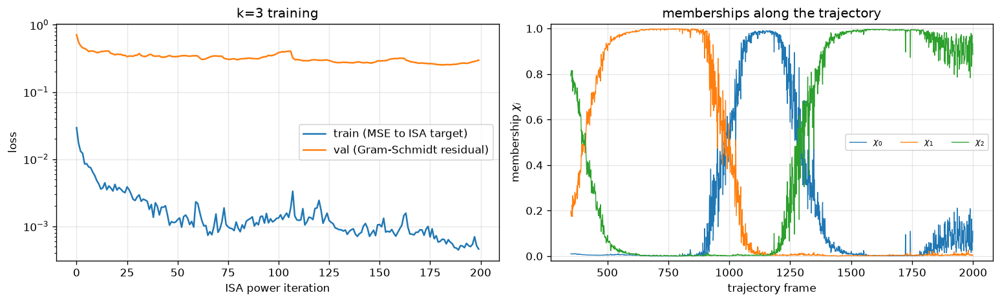

In [3]:
fig, ax = plt.subplots(1, 2, figsize=(13, 4))
A.plot_loss(m, ax=ax[0])
A.plot_chi_trajectory(chi, NSTART, ax=ax[1])
plt.tight_layout(); plt.savefig("loss_and_chi.png", dpi=150, bbox_inches="tight"); plt.show()

The k=3 memberships visualise directly as the barycentric **simplex triangle** (each vertex = one metastable state).

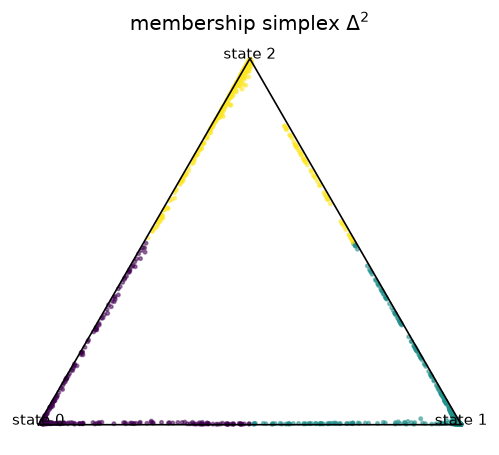

In [4]:
fig, ax = plt.subplots(figsize=(5, 5))
A.plot_simplex_triangle(chi, ax=ax)
plt.savefig("simplex_triangle.png", dpi=150, bbox_inches="tight"); plt.show()

## 4. Simplex edges — transition population and rare edges
For each edge $(i,j)$: `on_edge` counts frames with $\chi_i+\chi_j\ge0.8$, `transition` counts the subset with intermediate $s_{ij}\in[0.15,0.85]$ (genuine transition-state frames).  An edge is **relevant** when both endpoint states are visited, and **rare** when its transition count is far below the median relevant edge.

   edge  on_edge  transition  pop_i  pop_j  relevant  rare
    0-1      780         122    196    464      True      
    1-2     1219         127    464    641      True      
    0-2      960         159    196    641      True      

rare simplex edges: none


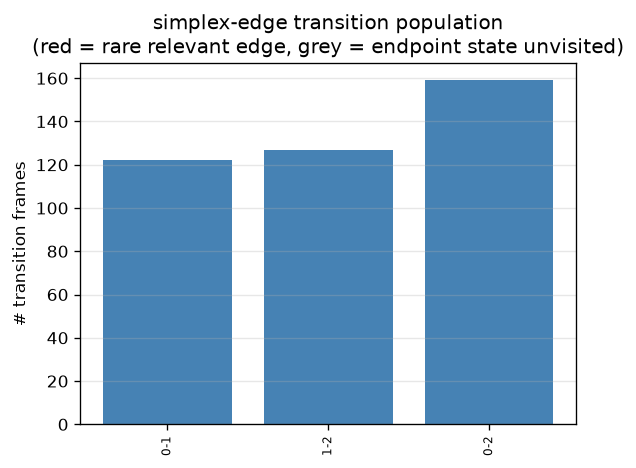

In [5]:
rows = A.edge_table(chi)
rare = A.rare_edges(rows)
print(A.format_edge_table(rows, rare))
print("\nrare simplex edges:", rare if rare else "none")

fig, ax = plt.subplots(figsize=(max(5, 0.5 * len(rows)), 4))
A.plot_edge_populations(rows, rare, ax=ax)
plt.tight_layout(); plt.savefig("edge_populations.png", dpi=150, bbox_inches="tight"); plt.show()

## 4b. Coarse-grained rate matrix (a principled cross-check on the edge table)
The edge table above flags rare edges by **counting on-edge frames** -- a kinematic heuristic. `amore.inverse_pcca.rate_matrix` gives a principled alternative: `Q = logm(Lambda_S) / tau`, the continuous-time generator of the coarse propagator `Lambda_S` (`inverse_pcca.py`'s own `G_hat^{-1} C_hat` Rayleigh-Ritz projection). Off-diagonal `Q[i,j]` is the coarse transition RATE `i -> j`; unlike frame-counting it comes with a timescale unit and needs no arbitrary on-edge/transition thresholds. See `examples/isokann_benchmark/inverse_pcca.ipynb`'s own rate-matrix section for the validation of this against a numerical reference on the (synthetic) benchmark systems -- 2cm2 has no such ground truth, so this is a diagnostic, not a validation.

In [6]:
import torch
SRC = os.path.abspath(os.path.join("..", "..", "..", "src"))
sys.path.insert(0, SRC)
import train
from amore.isokann import ChiNetMulti
from amore.inverse_pcca import inverse_pcca, rate_matrix, plot_rate_matrix

DEVICE = torch.device("cuda" if torch.cuda.is_available() else "cpu")
feats_q = data.build_features(use_pbc=True, verbose=False)
D0n, Dtn, _, _ = train.normalise(feats_q["D0"], feats_q["Dt"])
D0n, Dtn = D0n.to(DEVICE), Dtn.to(DEVICE)
Nq, Fq = D0n.shape; Kbq = Dtn.shape[1]

net_q = ChiNetMulti(Fq, K, hidden=m["hidden"]).to(DEVICE)
net_q.load_state_dict(m["net_state"]); net_q.eval()

def propagate_q():
    with torch.no_grad():
        flat = Dtn.reshape(Nq * Kbq, Fq)
        return net_q(flat).reshape(Nq, Kbq, -1).mean(1).cpu().numpy()

try:
    rate_result = inverse_pcca(chi, propagate_q, float(data.LAG), reversible=True)
except ValueError as e:
    print(f"reversible=True failed ({e})\n-> falling back to reversible=False (Schur route): "
          "a single un-resampled trajectory (N_REP=1) need not satisfy empirical detailed "
          "balance -- rate_matrix itself needs no eigendecomposition either way, only Lambda_S.")
    rate_result = inverse_pcca(chi, propagate_q, float(data.LAG), reversible=False)
Q = rate_matrix(rate_result.Lambda_S, float(data.LAG))
print(f"Lambda_S row sums: {rate_result.Lambda_S.sum(1).round(4)}")
print(f"invariance residual (RMS/entry): {rate_result.residual/np.sqrt(chi.size):.4f}")
print("coarse rate matrix Q (per frame):")
print(Q.round(5))
print("row sums (should be 0):", Q.sum(1).round(8))

edge_rank_frames = sorted(((r["transition"], r["edge"]) for r in rows if r["relevant"]), reverse=True)
edge_rank_rate = sorted(((abs(Q[i, j]) + abs(Q[j, i]), (i, j))
                         for i in range(K) for j in range(i + 1, K)), reverse=True)
print("\nedge ranking by transition-frame count:", [e for _, e in edge_rank_frames])
print("edge ranking by |rate|:              ", [e for _, e in edge_rank_rate])

reversible=True failed (inverse_pcca(reversible=True): Lambda_S has a non-negligible imaginary eigenvalue component (max |Im| = 2.249e-01) -- this looks non-reversible; call with reversible=False.)
-> falling back to reversible=False (Schur route): a single un-resampled trajectory (N_REP=1) need not satisfy empirical detailed balance -- rate_matrix itself needs no eigendecomposition either way, only Lambda_S.
Lambda_S row sums: [1. 1. 1.]
invariance residual (RMS/entry): 0.2334
coarse rate matrix Q (per frame):
[[-0.12298 -0.03576  0.15874]
 [ 0.15396 -0.01124 -0.14272]
 [ 0.00166  0.00795 -0.00962]]
row sums (should be 0): [-0.  0.  0.]

edge ranking by transition-frame count: [(0, 2), (1, 2), (0, 1)]
edge ranking by |rate|:               [(0, 1), (0, 2), (1, 2)]


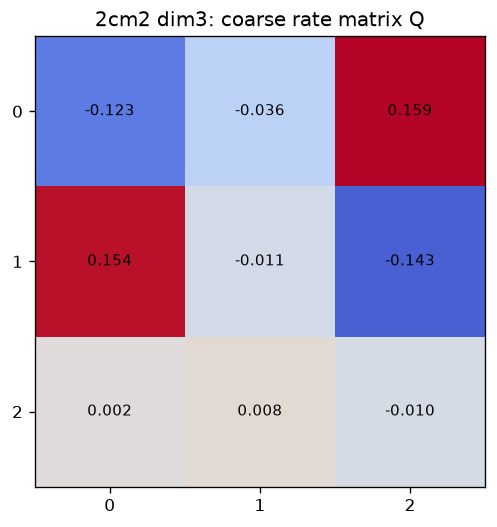

In [7]:
fig, ax = plt.subplots(figsize=(4.5, 4.5))
plot_rate_matrix(ax, Q, title=f"2cm2 dim{K}: coarse rate matrix Q")
plt.tight_layout(); plt.savefig("rate_matrix.png", dpi=150, bbox_inches="tight"); plt.show()

## 5. Zeroth-order transition pathways
For every **relevant** edge, take the on-edge frames, order them by the edge coordinate $s_{ij}$ (vertex $j\to$ vertex $i$), and write that reordered frame sequence to a DCD (+ PDB topology) under `pathways/`.  This is a zeroth-order approximation of the transition pathway — a reordering of existing frames, no interpolation.  Rare edges are exported too (flagged in the printout).

In [8]:
pdb, dcd = data.pdb_path(), data.dcd_path()
outdir = os.path.abspath("pathways")
os.makedirs(outdir, exist_ok=True)
summary = []
for r in rows:
    if not r["relevant"]:
        continue
    i, j = r["edge"]
    order, s = A.pathway_frames(chi, i, j)
    if len(order) == 0:
        continue
    stem = os.path.join(outdir, f"pathway_edge_{i}-{j}")
    n = A.export_pathway(order, NSTART, pdb, dcd, stem + ".dcd", stem + ".pdb")
    tag = "RARE" if (i, j) in rare else ""
    summary.append((f"{i}-{j}", n, round(float(s.min()), 3), round(float(s.max()), 3), tag))
    print(f"edge {i}-{j}: {n:4d} frames  s in [{s.min():.3f}, {s.max():.3f}]  "
          f"-> {os.path.basename(stem)}.dcd  {tag}")
print("\nwrote", len(summary), "pathway DCDs to", outdir)

/home/htc/jkresse/AMORE/.venv/lib/python3.11/site-packages/MDAnalysis/topology/PDBParser.py:309: UserWarning: PDB file is missing resid information.  Defaulted to '1'
  warnings.warn("PDB file is missing resid information.  "


/home/htc/jkresse/AMORE/.venv/lib/python3.11/site-packages/MDAnalysis/coordinates/DCD.py:171: DeprecationWarning: DCDReader currently makes independent timesteps by copying self.ts while other readers update self.ts inplace. This behavior will be changed in 3.0 to be the same as other readers. Read more at https://github.com/MDAnalysis/mdanalysis/issues/3889 to learn if this change in behavior might affect you.
  warnings.warn("DCDReader currently makes independent timesteps"
/home/htc/jkresse/AMORE/.venv/lib/python3.11/site-packages/MDAnalysis/coordinates/PDB.py:1282: UserWarning: Found no information for attr: 'formalcharges' Using default value of '0'
  warnings.warn(


edge 0-1:  780 frames  s in [0.001, 0.993]  -> pathway_edge_0-1.dcd  


edge 1-2: 1219 frames  s in [0.002, 0.999]  -> pathway_edge_1-2.dcd  


edge 0-2:  960 frames  s in [0.002, 0.994]  -> pathway_edge_0-2.dcd  

wrote 3 pathway DCDs to /home/htc/jkresse/AMORE/examples/2cm2/dim3/pathways


Overlay of the exported pathways in the edge coordinate — each curve is one edge's on-edge frames sorted by $s_{ij}$, coloured by whether it is a rare edge.

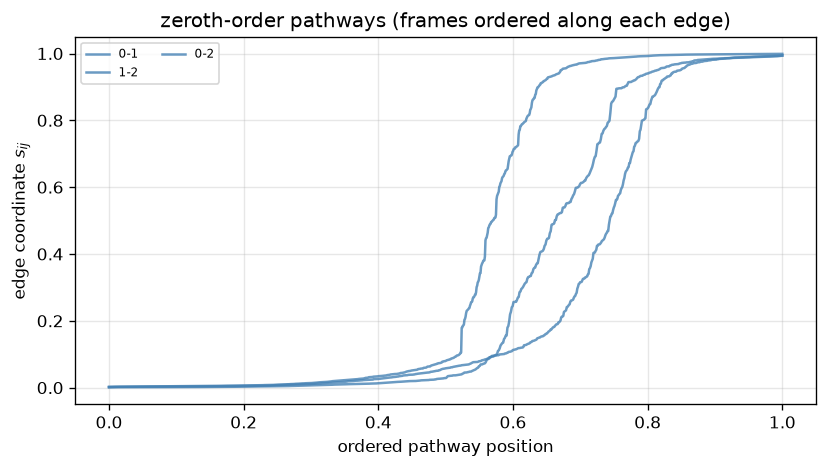

In [9]:
fig, ax = plt.subplots(figsize=(7, 4))
for r in rows:
    if not r["relevant"]:
        continue
    i, j = r["edge"]
    order, s = A.pathway_frames(chi, i, j)
    if len(order) == 0:
        continue
    c = "crimson" if (i, j) in rare else "steelblue"
    ax.plot(np.linspace(0, 1, len(s)), s, color=c, alpha=0.8,
            label=f"{i}-{j}" + (" (rare)" if (i, j) in rare else ""))
ax.set_xlabel("ordered pathway position"); ax.set_ylabel("edge coordinate $s_{ij}$")
ax.set_title("zeroth-order pathways (frames ordered along each edge)")
ax.legend(fontsize=7, ncol=2); ax.grid(alpha=0.3)
plt.tight_layout(); plt.savefig("pathways_edgecoord.png", dpi=150, bbox_inches="tight"); plt.show()

## 6. Metastable-state renders (PyMOL)
One **4K PNG per state**, zoomed on the ligand.  The representative pose (frame with $\chi_i$ closest to 0.95) is drawn as **one fat orange KB8**, with the other $\chi_i\in[0.9,1.0]$ poses — superposed **on the ligand** — as a faint pale-orange **halo** showing its conformational spread.  Protein residues within **5 Å** of the ligand are thin grey sticks, on a **see-through grey cartoon** (chopped, so nothing occludes the ligand).  Water/ions removed, white background.  Each state also gets an editable **`.pse`** you can open in a local PyMOL and rotate.  Rendered headless via the open-source PyMOL micromamba env; cached under `states/` (delete to re-render).

[render] all 3 state PNGs cached in /home/htc/jkresse/AMORE/examples/2cm2/dim3/states


state 0: state_0.png  (+ state_0.pse)


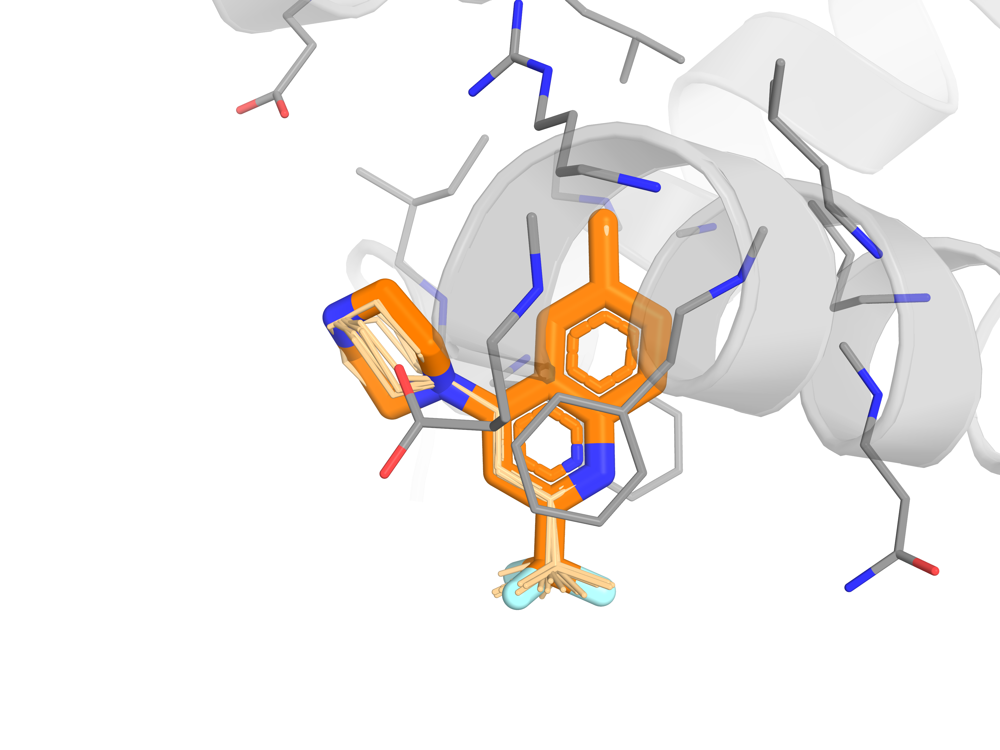

state 1: state_1.png  (+ state_1.pse)


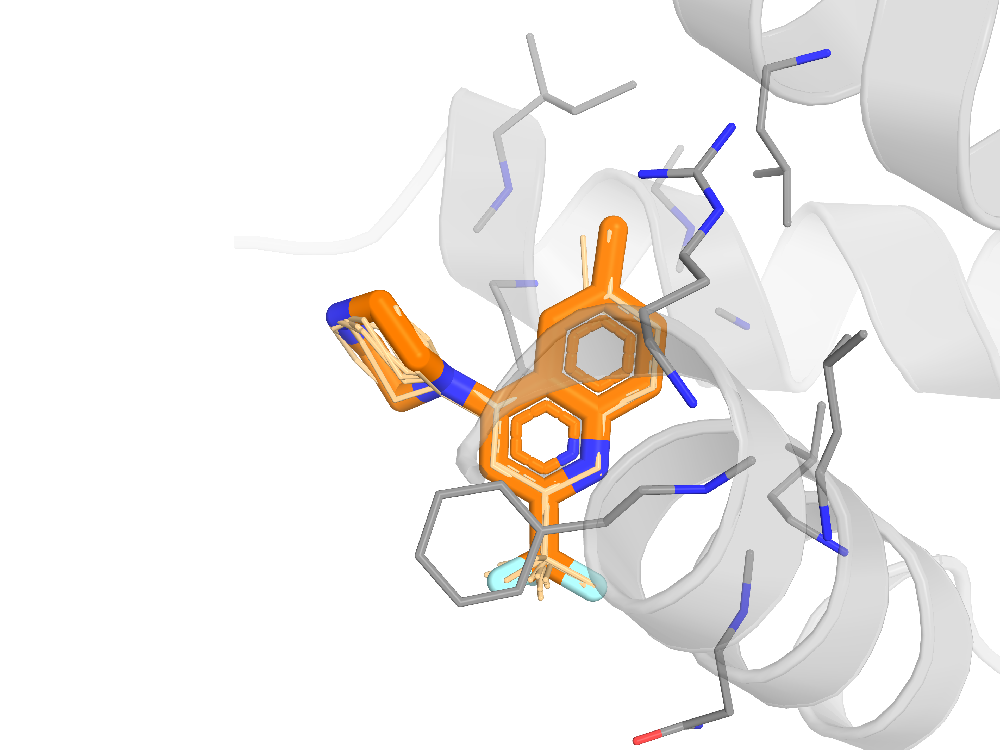

state 2: state_2.png  (+ state_2.pse)


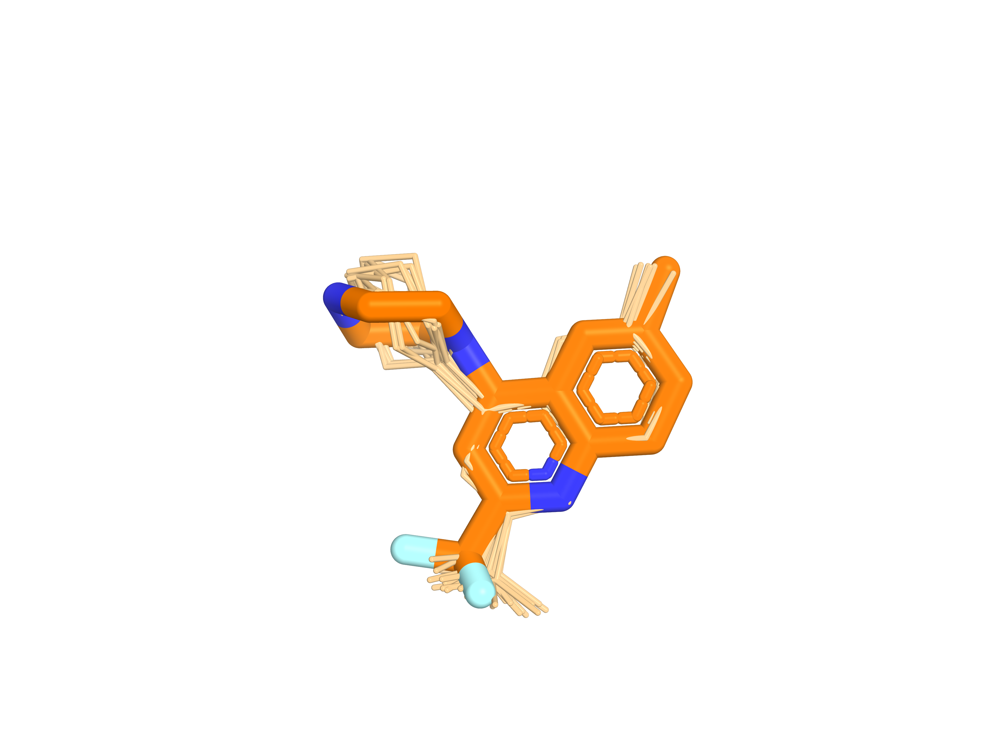

In [10]:
import render
from IPython.display import Image, display
# render.py's own cache check only looks at file existence, not content provenance -- if
# you change data.LAG/K and states/edges/ still holds a PREVIOUS config's renders, pass
# force=True here once to refresh them (see build.py's own note where this is set).
infos, state_pngs = render.render_model_states(K, verbose=True)
for i, p in enumerate(state_pngs):
    print(f"state {i}: {os.path.basename(p)}  (+ {os.path.basename(p)[:-4]}.pse)")
    display(Image(filename=p, width=560))

## 7. Per-edge transition-pathway sessions (PyMOL `.pse`)
For every **relevant** simplex edge, an editable **`.pse`** (+ 4K preview PNG) under `edges/`, in the same aesthetic as the state renders.  Each holds the zeroth-order pathway (on-edge frames ordered by $s_{ij}$, superposed on protein C$\alpha$) as a **playable multi-state object** — open the `.pse` in a local PyMOL and scrub the states to walk the transition $j\to i$ — plus the whole ligand **transition sweep** as a faint pale-orange halo over the see-through cartoon and 5 Å pocket sticks.

  edge 0-1: 60 frames (s 0.00->0.99)


  edge 1-2: 60 frames (s 0.00->1.00)


  edge 0-2: 60 frames (s 0.00->0.99)


edge 0-1: 60 frames, s 0.00->0.99  -> edge_0-1.pse


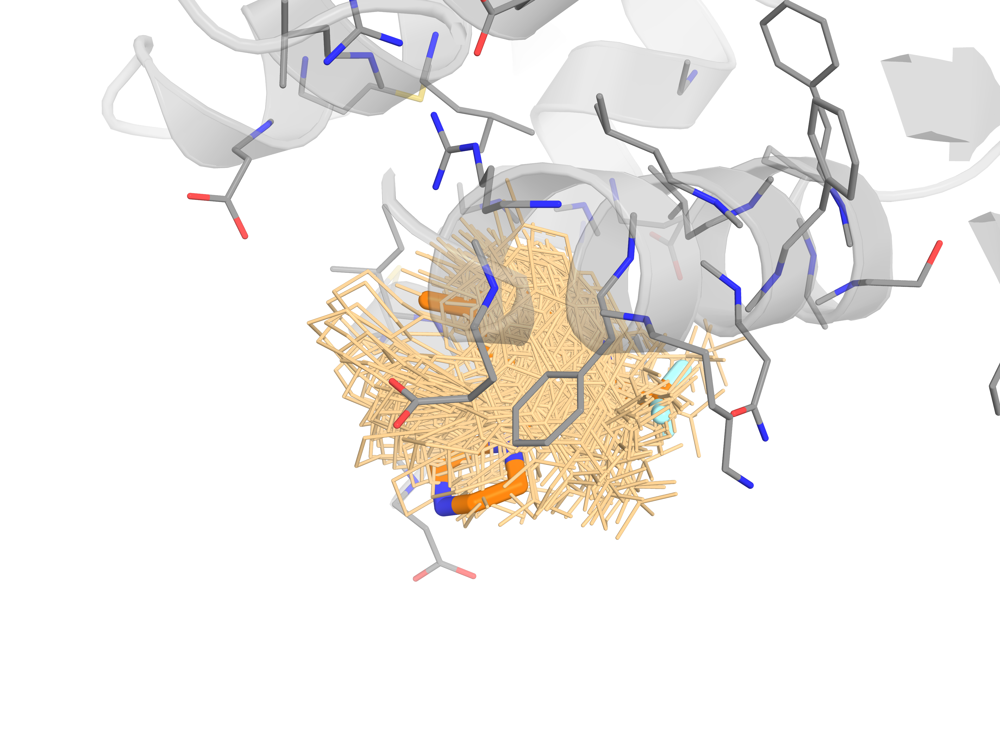

edge 1-2: 60 frames, s 0.00->1.00  -> edge_1-2.pse


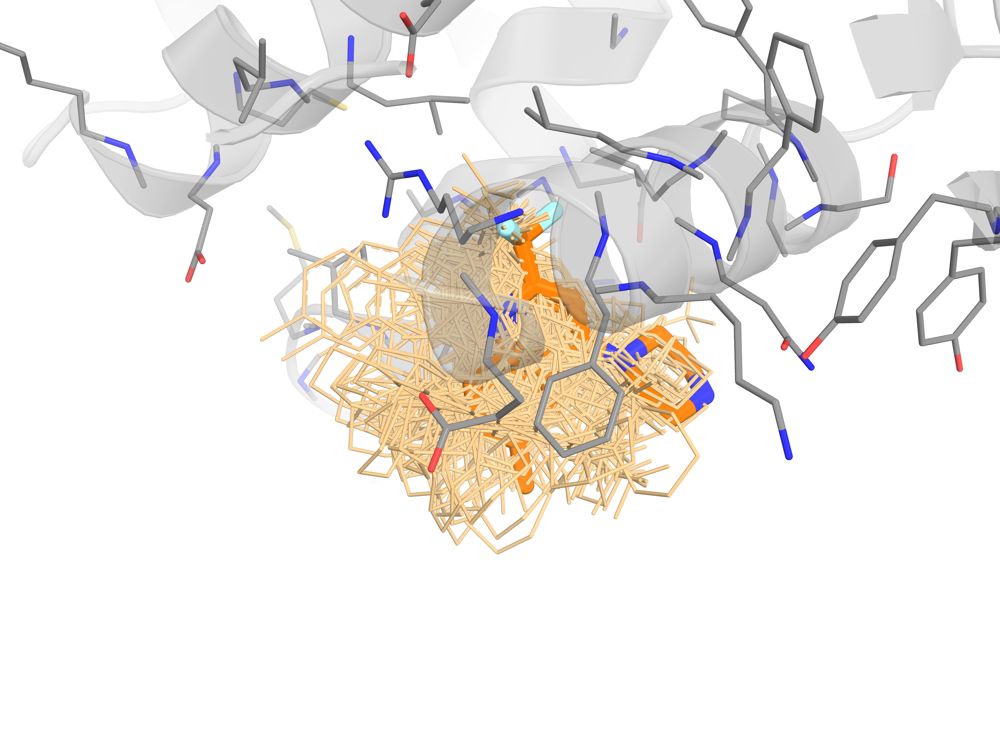

edge 0-2: 60 frames, s 0.00->0.99  -> edge_0-2.pse


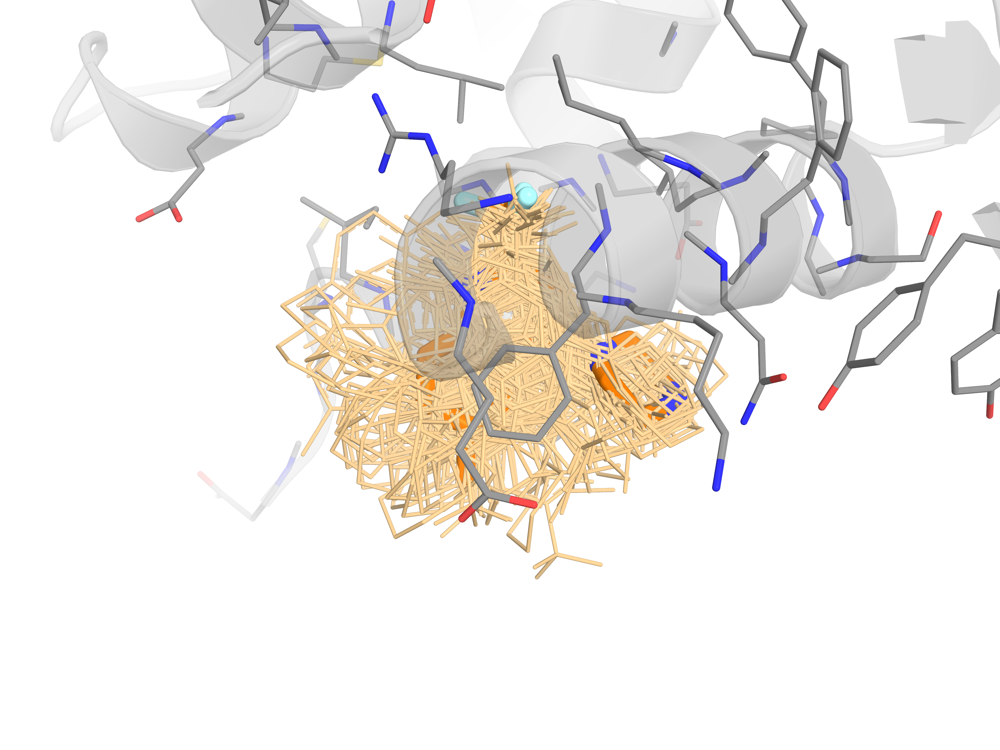

In [11]:
edge_infos = render.build_edge_pses(K, verbose=True)
for info in edge_infos:
    i, j = info["edge"]
    png = os.path.join(os.path.dirname(info["pse"]), f"edge_{i}-{j}.png")
    tag = " (RARE)" if info["rare"] else ""
    print(f"edge {i}-{j}{tag}: {info['n']} frames, s {info['s_lo']:.2f}->{info['s_hi']:.2f}"
          f"  -> {os.path.basename(info['pse'])}")
    if os.path.exists(png):
        display(Image(filename=png, width=560))

### Summary

- **k = 3** softmax-ISA memberships trained on the 2cm2 trajectory anchor frames
  (per-residue COM pairwise-distance features, PBC).
- The edge table above lists every simplex edge; **rare** edges (few transition frames
  between two visited states) are flagged in red.
- Each relevant edge's zeroth-order pathway is saved under `pathways/` as a DCD + PDB pair,
  with frames ordered along the edge coordinate.